In [2]:
import os
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision.utils import save_image
import torchvision.transforms as transforms
from torchvision import datasets, models, transforms
#from warmup_scheduler import GradualWarmupScheduler 

from torch.utils.tensorboard import SummaryWriter
import shutil
#import cv2

plt.style.use('seaborn')
import seaborn as sns
sns.set_style("whitegrid", {'axes.grid' : False})

import data_loaders as dl


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# Assignment 5

- a) Write **Convolutional** Variational Autoencoder for **SVHN** dataset
    - Model:
      - Use Conv. layers for encoder and TransposedConv. layers
      - You are allowed to use one FC-layer in each module for the bottleneck, but it's not necessary


Original dataset has weird labeling: images with 0 have label 10. But Pytorch has proper implementation of this dataset (0 is 0). So we have not to care about it 

In [3]:
mean = np.array([0.4914, 0.4822, 0.4465])
std = np.array([0.2470, 0.2435, 0.2616])

data_transforms = {
    'train':transforms.Compose([
                        transforms.ToTensor(),
                        transforms.Normalize(mean, std)
                    ]),
    'val': transforms.Compose([
                        transforms.ToTensor(),
                        transforms.Normalize(mean, std)
                    ])
}

train_loader, valid_loader = dl.load_train_data('svhn', 634, train_transf=data_transforms["train"], test_transf=data_transforms["val"], use_cutmix=False)

Using downloaded and verified file: ./data/train_32x32.mat
Using downloaded and verified file: ./data/test_32x32.mat


torch.Size([634, 3, 32, 32])


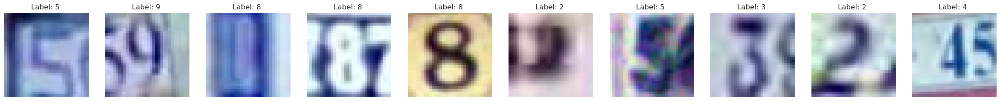

In [4]:
def show_n_samples_from_batch(sample_imgs, sample_labels, n_samples=6):
    """ Plotting n_samples from a batch of images """
    fig, ax = plt.subplots(1,n_samples)
    fig.set_size_inches(3 * n_samples, 3)

    ids = np.random.randint(low=0, high=len(sample_imgs), size=n_samples)

    for i, n in enumerate(ids):
        img = sample_imgs[n]

        # because of normalization of dataset images have strange range, let's fix it with normalization to range [0, 1] for adequate visualization
        img = img.clone().detach()
        img += np.abs(img.min())
        img /= img.max()
        label = f"{str(sample_labels[n].numpy())} "
        ax[i].imshow(img.permute(1,2,0))
        ax[i].set_title(f"Label: {label}")
        ax[i].axis("off")
    plt.show()

train_batch_aug = next(iter(train_loader))
print(train_batch_aug[0].shape)
sample_imgs_aug, sample_labels_aug = train_batch_aug

#helpers.show_n_samples_from_batch(sample_imgs, sample_labels, 8)
show_n_samples_from_batch(sample_imgs_aug, sample_labels_aug, 10)

In [5]:
train_loader.dataset.labels.max()

9

In [6]:
if not os.path.exists("imgs/conv_vae"):
    os.makedirs("imgs/conv_vae")

if not os.path.exists("imgs/vae"):
    os.makedirs("imgs/vae")

if not os.path.exists("imgs/cvae"):
    os.makedirs("imgs/cvae")

In [7]:
def save_model(model, optimizer, epoch, stats, model_name):
    """ Saving model checkpoint """
    
    if(not os.path.exists("models")):
        os.makedirs("models")
    if(not os.path.exists(f"models/{model_name}")):
        os.makedirs(f"models/{model_name}")
    savepath = f"models/{model_name}/checkpoint_epoch_{epoch}.pth"

    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'stats': stats
    }, savepath)
    return


def load_model(model, optimizer, savepath):
    """ Loading pretrained checkpoint """
    
    checkpoint = torch.load(savepath)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint["epoch"]
    stats = checkpoint["stats"]
    
    return model, optimizer, epoch, stats


def add_noise(img, mean=0, sigma=0.3):
    """ Adding AWGN to images"""
    noisy_img = img + torch.normal(mean * torch.ones(img.shape), sigma)
    return noisy_img.clamp(0,1)

In [8]:
def train_epoch(model, train_loader, optimizer, criterion, epoch, device, isConditional=False, classNum=10):
    """ Training a model for one epoch """
    
    loss_list = []
    recons_loss = []
    vae_loss = []
    
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader))
    for i, (images, labels) in progress_bar:
        images = images.to(device)
        if(isConditional):
            labels = labels.to(device)
            labels = F.one_hot(labels, classNum).float()
        
        # Clear gradients w.r.t. parameters
        optimizer.zero_grad()
         
        # Forward pass
        if(not isConditional):
            recons, (z, mu, log_var) = model(images)
        else:
            recons, (z, mu, log_var) = model(images, labels)
         
        # Calculate Loss
        loss, (mse, kld) = criterion(recons, images, mu, log_var)
        loss_list.append(loss.item())
        recons_loss.append(mse.item())
        vae_loss.append(kld.item())
        
        # Getting gradients w.r.t. parameters
        loss.backward()
         
        # Updating parameters
        optimizer.step()
        
        progress_bar.set_description(f"Epoch {epoch+1} Iter {i+1}: loss {loss.item():.5f}. ")
        
    mean_loss = np.mean(loss_list)
    
    return mean_loss, loss_list


@torch.no_grad()
def eval_model(model, eval_loader, criterion, device, epoch=None, savefig=False, savepath="", isConditional=False, classNum=10):
    """ Evaluating the model for either validation or test """
    loss_list = []
    recons_loss = []
    kld_loss = []
    
    for i, (images, labels) in enumerate(eval_loader):
        images = images.to(device)
        if(isConditional):
            labels = labels.to(device)
            labels = F.one_hot(labels, classNum).float()

        
        # Forward pass 
        if(not isConditional):
            recons, (z, mu, log_var) = model(images)
        else:
            recons, (z, mu, log_var) = model(images, labels)
        loss, (mse, kld) = criterion(recons, images, mu, log_var)
        loss_list.append(loss.item())
        recons_loss.append(mse.item())
        kld_loss.append(kld.item())
        
        if(i==0 and savefig):
            save_image( recons[:64].cpu(), os.path.join(savepath, f"recons{epoch}.png") )
            
    # Total correct predictions and loss
    loss = np.mean(loss_list)
    recons_loss = np.mean(recons_loss)
    kld_loss = np.mean(kld_loss)
    return loss, recons_loss, kld_loss


def train_model(model, optimizer, scheduler, criterion, train_loader,
                valid_loader, num_epochs, savepath, save_frequency=5, isConditional=False, model_name="default"):
    """ Training a model for a given number of epochs"""
    
    train_loss = []
    val_loss =  []
    val_loss_recons =  []
    val_loss_kld =  []
    loss_iters = []
    
    for epoch in range(num_epochs):
           
        # validation epoch
        model.eval()  # important for dropout and batch norms
        log_epoch = (epoch % 5 == 0 or epoch == num_epochs - 1)
        loss, recons_loss, kld_loss = eval_model(
                model=model, eval_loader=valid_loader, criterion=criterion,
                device=device, epoch=epoch, savefig=log_epoch, savepath=savepath, isConditional=isConditional
            )
        val_loss.append(loss)
        val_loss_recons.append(recons_loss)
        val_loss_kld.append(kld_loss)
        
        # training epoch
        model.train()  # important for dropout and batch norms
        mean_loss, cur_loss_iters = train_epoch(
                model=model, train_loader=train_loader, optimizer=optimizer,
                criterion=criterion, epoch=epoch, device=device, isConditional=isConditional
            )
        
        # PLATEAU SCHEDULER
        scheduler.step(val_loss[-1])
        train_loss.append(mean_loss)
        loss_iters = loss_iters + cur_loss_iters
        
        if(epoch % save_frequency == 0):
            stats = {
                "train_loss": train_loss,
                "valid_loss": val_loss,
                "loss_iters": loss_iters
            }
            save_model(model=model, optimizer=optimizer, epoch=epoch, stats=stats, model_name=model_name)
        
        if(log_epoch):
            print(f"    Train loss: {round(mean_loss, 5)}")
            print(f"    Valid loss: {round(loss, 5)}")
            print(f"       Valid loss recons: {round(val_loss_recons[-1], 5)}")
            print(f"       Valid loss KL-D:   {round(val_loss_kld[-1], 5)}")
    
    print(f"Training completed")
    return train_loss, val_loss, loss_iters, val_loss_recons, val_loss_kld


def smooth(f, K=5):
    """ Smoothing a function using a low-pass filter (mean) of size K """
    kernel = np.ones(K) / K
    f = np.concatenate([f[:int(K//2)], f, f[int(-K//2):]])  # to account for boundaries
    smooth_f = np.convolve(f, kernel, mode="same")
    smooth_f = smooth_f[K//2: -K//2]  # removing boundary-fixes
    return smooth_f


def set_random_seed(random_seed=None):
    """
    Using random seed for numpy and torch
    """
    if(random_seed is None):
        random_seed = CONFIG["random_seed"]
    os.environ['PYTHONHASHSEED'] = str(random_seed)
    random.seed(random_seed)
    np.random.seed(random_seed)
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)
    return


def count_model_params(model):
    """ Counting the number of learnable parameters in a nn.Module """
    num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return num_params

In [9]:
def normalize_img(img):
    # normalize image according to the mean and std of the dataset
    img = img.permute(1,2,0)
    img = img * torch.tensor(std).view(1,1,3) + torch.tensor(mean).view(1,1,3)
    img = img.clip(0, 1)
    return img

<center><img style="width: 40%" src="resources/vae.png"></center>
<!-- image taken from  https://towardsdatascience.com/understanding-conditional-variational-autoencoders-cd62b4f57bf8 -->

In [10]:
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)

class UnFlatten(nn.Module):
    def forward(self, input, size=256):
        return input.view(input.size(0), size, 1, 1)

class VAE(nn.Module):
    def __init__(self, image_channels=3, h_dim=256, latent_size=10):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(image_channels, 32, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2),
            nn.ReLU(),
            Flatten()
        )
        
        self.fc1 = nn.Linear(h_dim, latent_size)
        self.fc2 = nn.Linear(h_dim, latent_size)
        self.fc3 = nn.Linear(latent_size, h_dim)
        
        self.decoder = nn.Sequential(
            UnFlatten(),
            nn.ConvTranspose2d(h_dim, 128, kernel_size=3, stride=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, image_channels, kernel_size=4, stride=2),
            nn.Sigmoid(),
        )
        
    def reparameterize(self, mu, logvar):
        std = logvar.mul(0.5).exp_().to(device)
        mu = mu.to(device)
        # return torch.normal(mu, std)
        esp = torch.randn(*mu.size()).to(device)
        z = mu + std * esp
        return z
    
    def bottleneck(self, h):
        mu, logvar = self.fc1(h), self.fc2(h)
        z = self.reparameterize(mu, logvar)
        return z, mu, logvar

    def encode(self, x):
        
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        return z, mu, logvar

    def decode(self, z):
        z = self.fc3(z)
        z = self.decoder(z)
        return z

    def forward(self, x):
        z, mu, logvar = self.encode(x)
        x_hat = self.decode(z)
        return x_hat, (z, mu, logvar)

def loss_fn(recon_x, x, mu, logvar):
    #BCE = F.binary_cross_entropy(recon_x, x, size_average=False)
    recons_loss = F.mse_loss(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    return recons_loss + KLD, (recons_loss, KLD)


In [11]:
vae = VAE(latent_size=12).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)
criterion = loss_fn

train_los_vae, val_los_vae, los_iters_vae, val_los_recons_vae, val_los_kld_vae = train_model(
    model=vae, optimizer=optimizer, scheduler=scheduler, criterion=criterion, train_loader=train_loader, valid_loader=valid_loader, num_epochs=45, savepath="imgs/vae", save_frequency=5,
    model_name="vae"   
)

Epoch 1 Iter 115: loss 988789.18750. : 100%|██████████| 115/115 [00:05<00:00, 19.83it/s] 


    Train loss: 1134196.50598
    Valid loss: 2153902.82031
       Valid loss recons: 2153902.82031
       Valid loss KL-D:   0.00149


Epoch 6 Iter 115: loss 849562.25000. : 100%|██████████| 115/115 [00:09<00:00, 12.09it/s]

    Train loss: 834817.42989
    Valid loss: 997714.62416
       Valid loss recons: 997693.40327
       Valid loss KL-D:   21.22262



Epoch 11 Iter 115: loss 807771.06250. : 100%|██████████| 115/115 [00:07<00:00, 14.39it/s]


    Train loss: 822077.69511
    Valid loss: 978613.85314
       Valid loss recons: 978596.0599
       Valid loss KL-D:   17.79318


Epoch 16 Iter 115: loss 805231.56250. : 100%|██████████| 115/115 [00:08<00:00, 13.28it/s]


    Train loss: 818289.14674
    Valid loss: 974529.50019
       Valid loss recons: 974515.48391
       Valid loss KL-D:   14.01398


Epoch 21 Iter 115: loss 824244.12500. : 100%|██████████| 115/115 [00:10<00:00, 10.49it/s]


    Train loss: 816029.94837
    Valid loss: 972491.26097
       Valid loss recons: 972478.58975
       Valid loss KL-D:   12.67805


Epoch 26 Iter 115: loss 834047.25000. : 100%|██████████| 115/115 [00:10<00:00, 10.57it/s]


    Train loss: 814185.88967
    Valid loss: 971618.10166
       Valid loss recons: 971606.72814
       Valid loss KL-D:   11.37181


Epoch 31 Iter 115: loss 807450.81250. : 100%|██████████| 115/115 [00:10<00:00, 10.56it/s]

    Train loss: 812836.44239
    Valid loss: 970490.8418
       Valid loss recons: 970480.35203
       Valid loss KL-D:   10.4922



Epoch 36 Iter 115: loss 786575.25000. : 100%|██████████| 115/115 [00:09<00:00, 11.73it/s]


    Train loss: 812004.81359
    Valid loss: 969563.37091
       Valid loss recons: 969553.2021
       Valid loss KL-D:   10.16639


Epoch 41 Iter 115: loss 775804.37500. : 100%|██████████| 115/115 [00:08<00:00, 14.22it/s]


    Train loss: 810744.92446
    Valid loss: 969172.53906
       Valid loss recons: 969162.79697
       Valid loss KL-D:   9.74266


Epoch 45 Iter 115: loss 797416.43750. : 100%|██████████| 115/115 [00:10<00:00, 10.84it/s]

    Train loss: 809845.84891
    Valid loss: 968797.38765
       Valid loss recons: 968787.77074
       Valid loss KL-D:   9.6226
Training completed


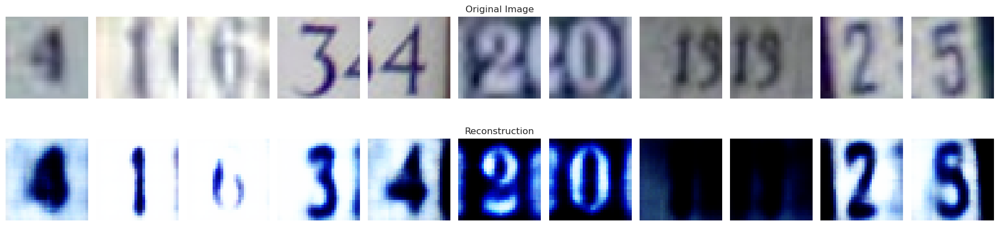

In [12]:
imgs, _ = next(iter(valid_loader)) 

vae.eval()
with torch.no_grad():
    recons, _ = vae(imgs.to(device))
    
fig, ax = plt.subplots(2, 11)
fig.set_size_inches(18, 5)
for i in range(11):
    img = imgs[i+15]
    img = normalize_img(img)
    recon = recons[i+15]
    recon = recon.cpu().permute(1,2,0)
    ax[0, i].imshow(img)
    ax[0, i].axis("off")
    ax[1, i].imshow(recon)
    ax[1, i].axis("off")

ax[0, 5].set_title("Original Image")
ax[1, 5].set_title("Reconstruction")
plt.tight_layout()
plt.show()

In [13]:
def plot_metrics(loss_iters, train_loss, val_loss, val_loss_recons, val_loss_kld):
    filtered_loss_iters = np.array(loss_iters)
    med = np.median(filtered_loss_iters)
    filtered_loss_iters[loss_iters < med / 2] = med

    plt.style.use('seaborn')
    fig, ax = plt.subplots(1,4)
    fig.set_size_inches(30,5)

    smooth_loss = smooth(filtered_loss_iters, 31)
    ax[0].plot(filtered_loss_iters, c="blue", label="Loss", linewidth=3, alpha=0.5)
    ax[0].plot(smooth_loss, c="red", label="Smoothed Loss", linewidth=3, alpha=1)
    ax[0].legend(loc="best")
    ax[0].set_xlabel("Iteration")
    ax[0].set_ylabel("CE Loss")
    ax[0].set_yscale("log")
    ax[0].set_title("Training Progress")

    smooth_loss = smooth(filtered_loss_iters, 31)
    START = 500
    N_ITERS = len(filtered_loss_iters)
    ax[1].plot(np.arange(START, N_ITERS), filtered_loss_iters[START:], c="blue", label="Loss", linewidth=3, alpha=0.5)
    ax[1].plot(np.arange(START, N_ITERS), smooth_loss[START:], c="red", label="Smoothed Loss", linewidth=3, alpha=1)
    ax[1].legend(loc="best")
    ax[1].set_xlabel("Iteration")
    ax[1].set_ylabel("Loss")
    ax[1].set_yscale("log")
    ax[1].set_title(f"Training Progress from Iter {START}")

    epochs = np.arange(len(train_loss)) + 1
    ax[2].plot(epochs[1:], train_loss[1:], c="red", label="Train Loss", linewidth=3)
    ax[2].plot(epochs[1:], val_loss[1:], c="blue", label="Valid Loss", linewidth=3)
    ax[2].legend(loc="best")
    ax[2].set_xlabel("Epochs")
    ax[2].set_ylabel("Loss")
    ax[2].set_title("Loss Curves")

    epochs = np.arange(len(val_loss)) + 1
    ax[3].plot(epochs[1:], val_loss[1:], c="blue", label="Valid Loss Total", linewidth=3)
    ax[3].plot(epochs[1:], val_loss_recons[1:], c="green", label="Recons. Loss", linewidth=2)
    ax[3].plot(epochs[1:], val_loss_kld[1:], c="purple", label="KLD Loss", linewidth=2)
    ax[3].legend(loc="best")
    ax[3].set_xlabel("Epochs")
    ax[3].set_ylabel("Loss")
    ax[3].set_yscale("log")
    ax[3].set_title("Independent Loss Curves")

    plt.show()





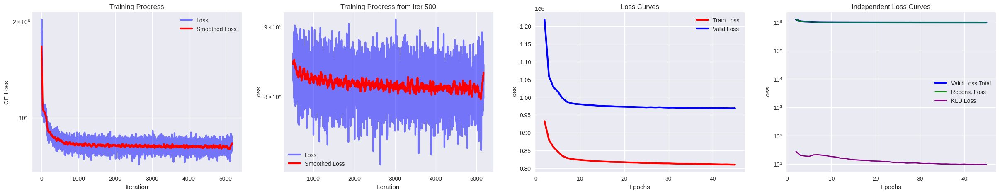

In [14]:
plot_metrics(los_iters_vae, train_los_vae, val_los_vae, val_los_recons_vae, val_los_kld_vae)

- b) Implement a Conditional Variational Autoencoder, which generates images based on a given class. Show the capabilities of your model.

<center><img style="width: 40%" src="resources/cvae_1.png"></center>
<!-- image taken from  https://towardsdatascience.com/understanding-conditional-variational-autoencoders-cd62b4f57bf8 -->

In [15]:
class CVAE(nn.Module):
    def __init__(self, input_size, latent_size, class_size):
        super(CVAE, self).__init__()
        self.input_size = input_size
        self.class_size = class_size
        self.latent_size = latent_size
        self.units = 400
        self.encode1 = nn.Linear(input_size + self.class_size, self.units)
        self.encode2 = nn.Linear(self.units, self.units//2)
        self.encode3 = nn.Linear(self.units//2, latent_size)
        self.encode4 = nn.Linear(self.units//2, latent_size)
        self.decode1 = nn.Linear(latent_size + self.class_size, self.units//2)
        self.decode2 = nn.Linear(self.units//2, self.units)
        self.decode3 = nn.Linear(self.units, self.input_size)



    def encoding_model(self, x, c):
        theinput = torch.cat((x.float(), c.float()), 1)
        output = self.encode1(theinput)
        output = self.encode2(output)
        mu = self.encode3(output)
        logvar = self.encode4(output)
        return mu, logvar

    def decoding_model(self, z, c):
        z_input = torch.cat((z.float(), c.float()), 1)
        output = self.decode1(z_input)
        output = self.decode2(output)
        x_hat = self.decode3(output)
        return x_hat

    def forward(self, x, c):
        x = x.view(-1, 32*32*3)
        #c = c.view(-1, 10*3)
        mu, logvar = self.encoding_model(x, c)
        z = self.reparametrize(mu, logvar)
        x_hat = self.decoding_model(z, c)
        x_hat = x_hat.view(-1, 3, 32, 32)
        return x_hat, (z, mu, logvar)
   
    def reparametrize(self, mu, logvar):
        # std = logvar.mul(0.5).exp_()
        # epsilon = Variable(std.data.new(std.size()).normal_())
        # return epsilon.mul(std) + mu

        """ Reparametrization trick"""
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)  # random sampling happens here
        z = mu + std * eps
        return z


def cvae_loss(recon_x, x, mu, logvar, lambda_kld=1e-3):
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')
    # BCE = nn.MSELoss(reduction='sum')(recon_x, x)
    KLD = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    return recon_loss + KLD, (recon_loss, KLD)


In [16]:
latent_size = 12
cvae = CVAE(32*32*3, latent_size, 10).to(device)
cvae_optimizer = torch.optim.Adam(cvae.parameters(), lr=1e-4)
cvae_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(cvae_optimizer, mode='min', factor=0.5, patience=5, verbose=True)


train_loss_cvae, val_loss_cvae, los_iters_cvae, val_loss_recons_cvae, val_loss_kld_cvae = train_model(
    model=cvae, optimizer=cvae_optimizer, scheduler=cvae_scheduler, criterion=cvae_loss, train_loader=train_loader, valid_loader=valid_loader, num_epochs=45, savepath="imgs/cvae", save_frequency=5,
    isConditional=True, model_name="cvae"
)


Epoch 1 Iter 115: loss 342500.31250. : 100%|██████████| 115/115 [00:07<00:00, 14.61it/s]


    Train loss: 620922.36603
    Valid loss: 1615196.40272
       Valid loss recons: 1615196.40234
       Valid loss KL-D:   0.01717


Epoch 6 Iter 115: loss 201693.90625. : 100%|██████████| 115/115 [00:07<00:00, 15.02it/s]


    Train loss: 200263.14497
    Valid loss: 208863.44589
       Valid loss recons: 208801.61007
       Valid loss KL-D:   61.83553


Epoch 11 Iter 115: loss 185338.18750. : 100%|██████████| 115/115 [00:10<00:00, 11.08it/s]


    Train loss: 198050.17867
    Valid loss: 205495.24272
       Valid loss recons: 205407.54987
       Valid loss KL-D:   87.69161


Epoch 16 Iter 115: loss 207263.62500. : 100%|██████████| 115/115 [00:08<00:00, 14.33it/s]


    Train loss: 197390.49688
    Valid loss: 204417.72726
       Valid loss recons: 204336.70336
       Valid loss KL-D:   81.02256


Epoch 21 Iter 115: loss 213864.53125. : 100%|██████████| 115/115 [00:08<00:00, 13.20it/s]


    Train loss: 197124.93342
    Valid loss: 203562.91392
       Valid loss recons: 203497.48898
       Valid loss KL-D:   65.42701


Epoch 26 Iter 115: loss 203515.07812. : 100%|██████████| 115/115 [00:08<00:00, 12.85it/s]


    Train loss: 196862.16128
    Valid loss: 203392.75219
       Valid loss recons: 203341.09998
       Valid loss KL-D:   51.65167


Epoch 31 Iter 115: loss 195785.01562. : 100%|██████████| 115/115 [00:07<00:00, 15.20it/s]


Epoch 00031: reducing learning rate of group 0 to 5.0000e-05.
    Train loss: 196728.71889
    Valid loss: 203432.8747
       Valid loss recons: 203391.90504
       Valid loss KL-D:   40.97023


Epoch 36 Iter 115: loss 185014.10938. : 100%|██████████| 115/115 [00:08<00:00, 12.80it/s]


    Train loss: 196509.64715
    Valid loss: 203049.3754
       Valid loss recons: 203011.53213
       Valid loss KL-D:   37.84255


Epoch 41 Iter 115: loss 199231.92188. : 100%|██████████| 115/115 [00:08<00:00, 13.18it/s]


    Train loss: 196472.45598
    Valid loss: 203005.46126
       Valid loss recons: 202970.15811
       Valid loss KL-D:   35.30274


Epoch 45 Iter 115: loss 186239.51562. : 100%|██████████| 115/115 [00:10<00:00, 11.28it/s]

Epoch 00045: reducing learning rate of group 0 to 2.5000e-05.
    Train loss: 196446.67378
    Valid loss: 203177.43676
       Valid loss recons: 203144.11054
       Valid loss KL-D:   33.32582
Training completed


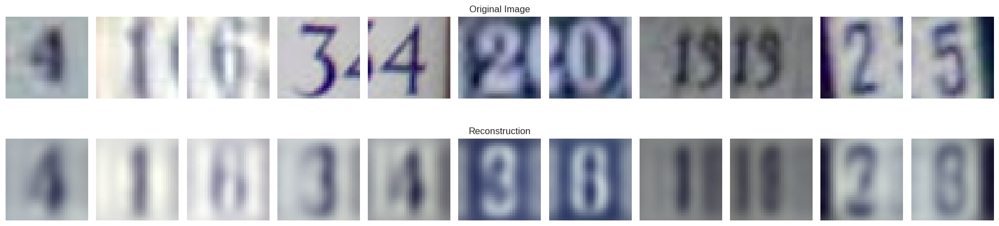

In [17]:
imgs, labels = next(iter(valid_loader)) 
labels = F.one_hot(labels, 10)

cvae.eval()
with torch.no_grad():
    recons, _ = cvae(imgs.to(device), labels.to(device))
    
fig, ax = plt.subplots(2, 11)
fig.set_size_inches(18, 5)
for i in range(11):
    img = imgs[i+15]
    img = normalize_img(img)
    recon = recons[i+15]
    recon = normalize_img(recon.cpu())
    # recon = recon.cpu().permute(1,2,0)
    ax[0, i].imshow(img)
    ax[0, i].axis("off")
    ax[1, i].imshow(recon)
    ax[1, i].axis("off")

ax[0, 5].set_title("Original Image")
ax[1, 5].set_title("Reconstruction")
plt.tight_layout()
plt.show()

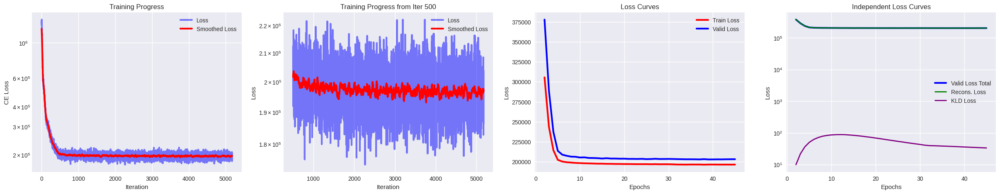

In [18]:
plot_metrics(los_iters_cvae, train_loss_cvae, val_loss_cvae, val_loss_recons_cvae, val_loss_kld_cvae)

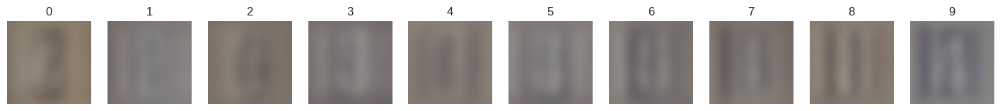

In [19]:
@torch.no_grad()
def generate_samples(model, num_samples=10, class_size=10, c_multiplayer=1 ):
    model.eval()
    samples = []
    for i in range(num_samples):
        z = torch.randn(1, 12).to(device)
        z *= 2
        #z = - F.one_hot(torch.tensor([i]), 20).to(device)
        c = F.one_hot(torch.tensor([i]), class_size).to(device)
        sample = model.decoding_model(z, c*c_multiplayer)
        sample = sample.view(3, 32, 32)
        samples.append(sample)
    return samples

def generateNshow(model, num_samples=10, class_size=10, c_multiplayer=1):

    samples = generate_samples(model, num_samples=num_samples, class_size=class_size, c_multiplayer=c_multiplayer)
    fig, ax = plt.subplots(1, 10)
    fig.set_size_inches(18, 5)
    for i in range(10):
        sample = samples[i]
    
        sample = normalize_img(sample.cpu())
        ax[i].imshow(sample)
        ax[i].axis("off")
        ax[i].set_title(f"{i}")
    plt.show()


generateNshow(cvae, num_samples=10, class_size=10, c_multiplayer=1)

We can see very "weak" numbers which correspond to the labels. <br>
Let's try to multiply the one_hot encoded label vector

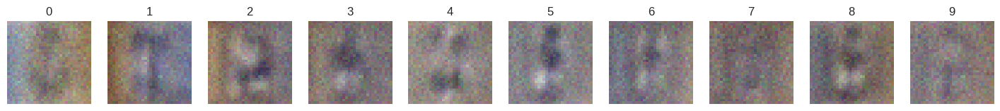

In [20]:
generateNshow(cvae, num_samples=10, class_size=10, c_multiplayer=15)


Now we can see the numbers better <br>
As the latent space is big, the random values in function generateNshow(..) have more impact on the final result. And some images of numbers do not fully correspond to the labels <br>
I have tried it with latent space size = 2. In this case result image depends on the given label much stronger. But the results of reconstruction are weaker.

- c) Investigate latent space and visualize some interpolations

In [21]:
@torch.no_grad()
def plot_reconstructed(model, xrange=(-3, 3), yrange=(-2, 2), N=12, conditional=False, cond_vis_mode: ("diag","hori","vert")="diag"):
    """
    Sampling equispaced points from the latent space givent the xange and yrange, 
    decoding latents and visualizing distribution of the space
    """
    SIZE = 32
    grid = np.empty((N*SIZE, N*SIZE, 3))

    
    
    for i, y in enumerate(np.linspace(*yrange, N)):
        for j, x in enumerate(np.linspace(*xrange, N)):
            dummy_values = torch.randn(10)

            z = torch.Tensor([[x*2, y*2, *dummy_values]]).to(device)
            if conditional:
                if cond_vis_mode == "diag":
                    selected_label = int((i+j) / (2*(N-0.9)) * 10) 
                elif cond_vis_mode == "hori":
                    selected_label = int(i / (N-0.9) * 10)
                elif cond_vis_mode == "vert":
                    selected_label = int(j / (N-0.9) * 10)
                c = F.one_hot(torch.tensor([selected_label]), 10)
                # multiply one hot vector by 20 to make it more visible
                c *= 10
                c = c.to(device)
                x_hat = model.decoding_model(z, c).cpu()
            else:
                x_hat = model.decode(z).cpu()
            x_hat = x_hat.view(3, 32,32)
            
            grid[(N-1-i)*SIZE:(N-i)*SIZE, j*SIZE:(j+1)*SIZE] = normalize_img(x_hat)
           
    plt.figure(figsize=(12,20))
    plt.imshow(grid, extent=[*yrange, *xrange], cmap="gray")
    plt.axis("off")

Interpolations of Conv VAE:

As the latent space has 12 dimensions, it's difficult to observe all possible interpolations. But here are few samples of interpolations.

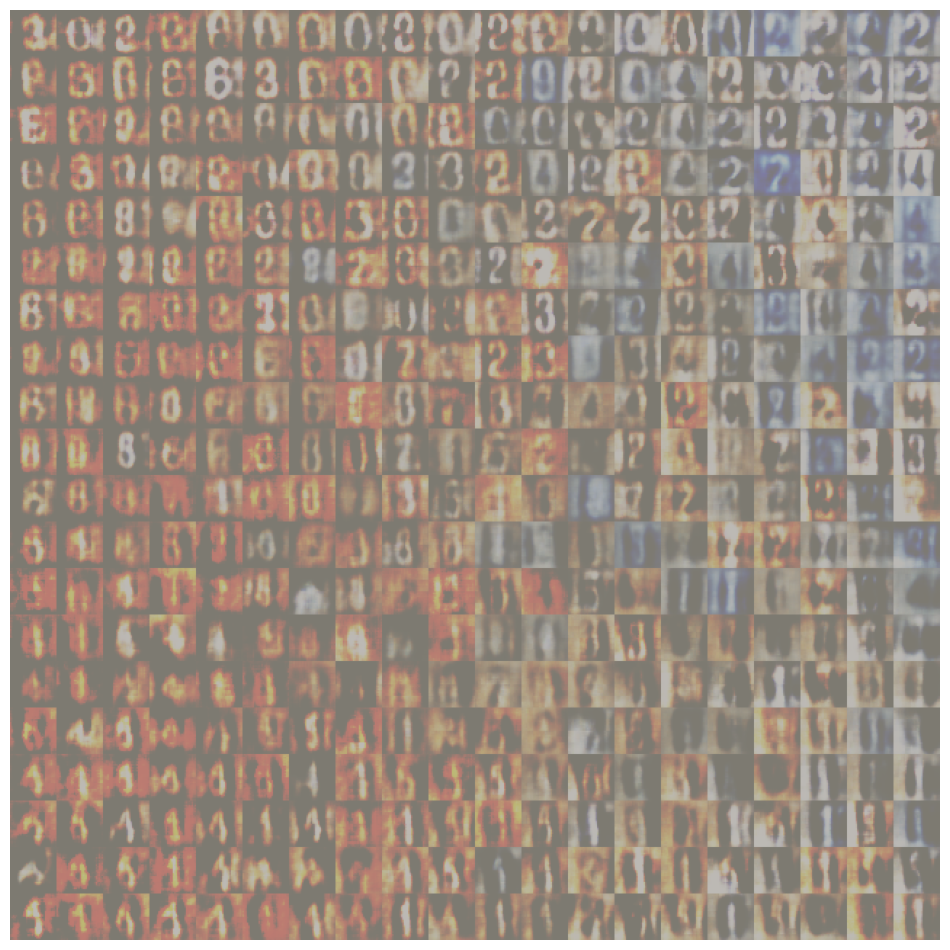

In [22]:
plot_reconstructed(vae, xrange=(-2, 2), yrange=(-2, 2), N=20, conditional=False)

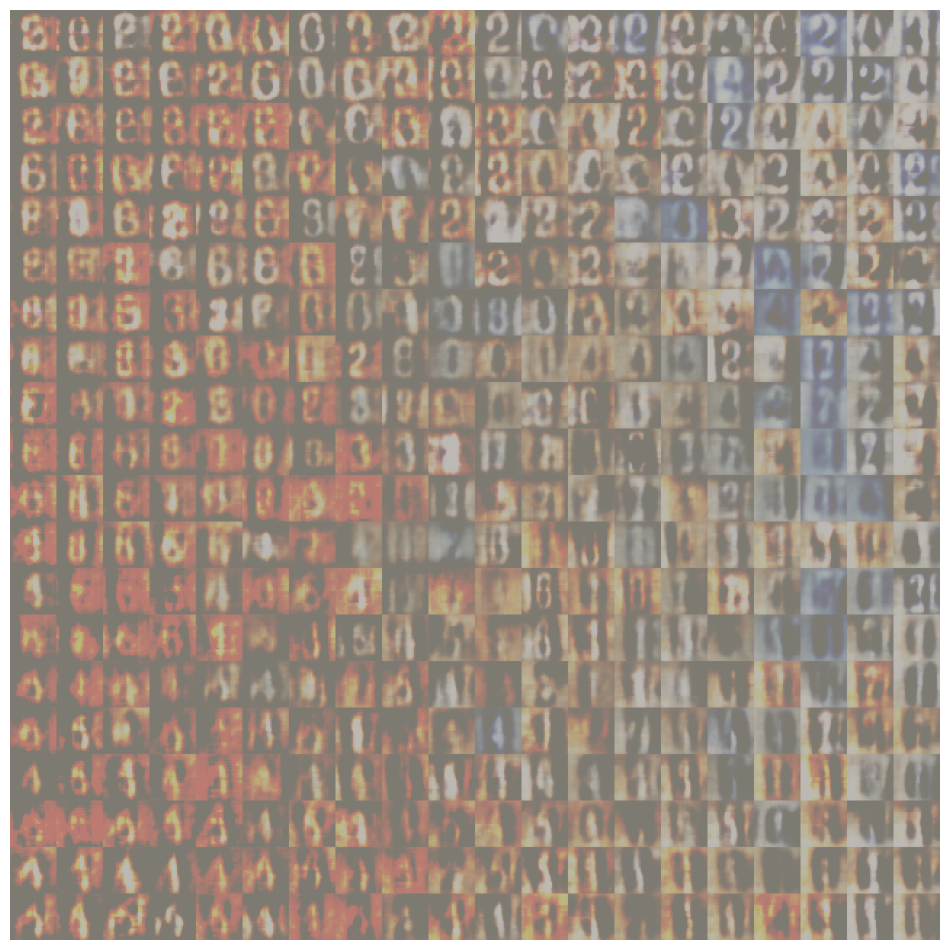

In [23]:
plot_reconstructed(vae, xrange=(-2, 2), yrange=(-2, 2), N=20, conditional=False)

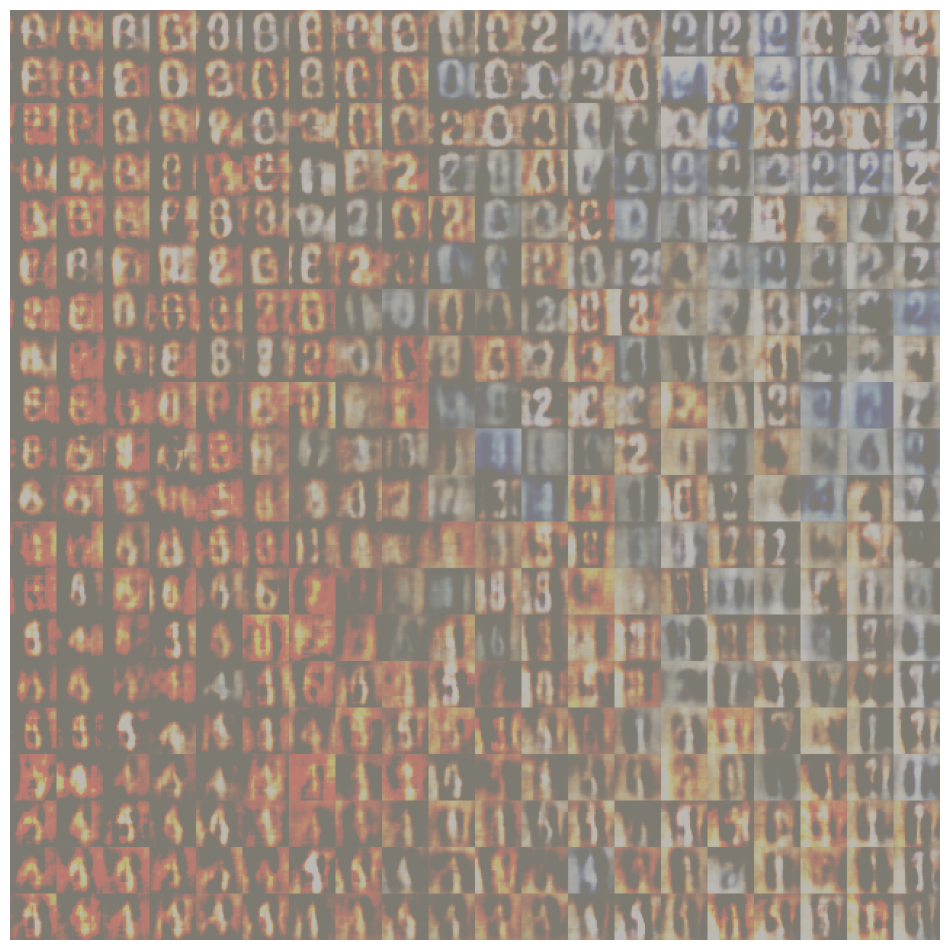

In [24]:
plot_reconstructed(vae, xrange=(-2, 2), yrange=(-2, 2), N=20, conditional=False)

Investigation of latent space of Variational AE

In [45]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

imgs_flat, latents, labels = [], [], []
with torch.no_grad():
    for imgs, lbls in valid_loader:
        imgs = imgs.to(device)
        # convert labels tensor to one hot vector
        _, (z, _, _) = vae(imgs)
        imgs_flat.append(imgs.cpu().view(imgs.shape[0],-1))
        latents.append(z.cpu())
        labels.append(lbls.cpu())
        
imgs_flat = np.concatenate(imgs_flat)    
latents = np.concatenate(latents)
labels = np.concatenate(labels)

In [46]:
COLORS = ['r', 'b', 'g', 'y', 'purple', 'orange', 'k', 'brown', 'grey',
          'c', "gold", "fuchsia", "lime", "darkred", "tomato", "navy"]

def display_projections(points, labels, ax=None, legend=None):
    """ Displaying low-dimensional data projections """
    
    legend = [f"Class {l}" for l in np.unique(labels)] if legend is None else legend
    if(ax is None):
        _, ax = plt.subplots(1,1,figsize=(12,6))
    
    for i,l in enumerate(np.unique(labels)):
        idx = np.where(l==labels)

        ax.scatter(points[idx, 0], points[idx, 1], label=legend[int(l)], c=COLORS[i])
    ax.legend(loc="best")

In [47]:
pca_imgs = PCA(n_components=2).fit_transform(imgs_flat)
pca_latents = PCA(n_components=2).fit_transform(latents)

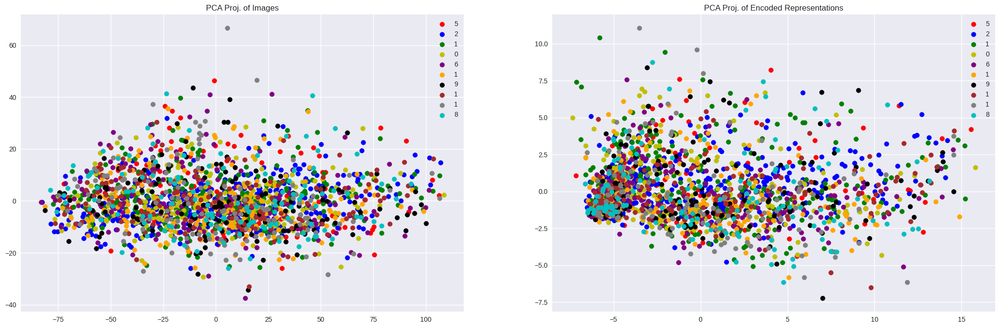

In [48]:
N = 2000
fig,ax = plt.subplots(1,2,figsize=(26,8))
display_projections(pca_imgs[:N], labels[:N], ax=ax[0], legend=valid_loader.dataset.labels)
ax[0].set_title("PCA Proj. of Images")
display_projections(pca_latents[:N], labels[:N], ax=ax[1], legend=valid_loader.dataset.labels)
ax[1].set_title("PCA Proj. of Encoded Representations")
plt.show()

Result with encoded representation seems not much better than PCA of images 

Interpolations of CVAE:

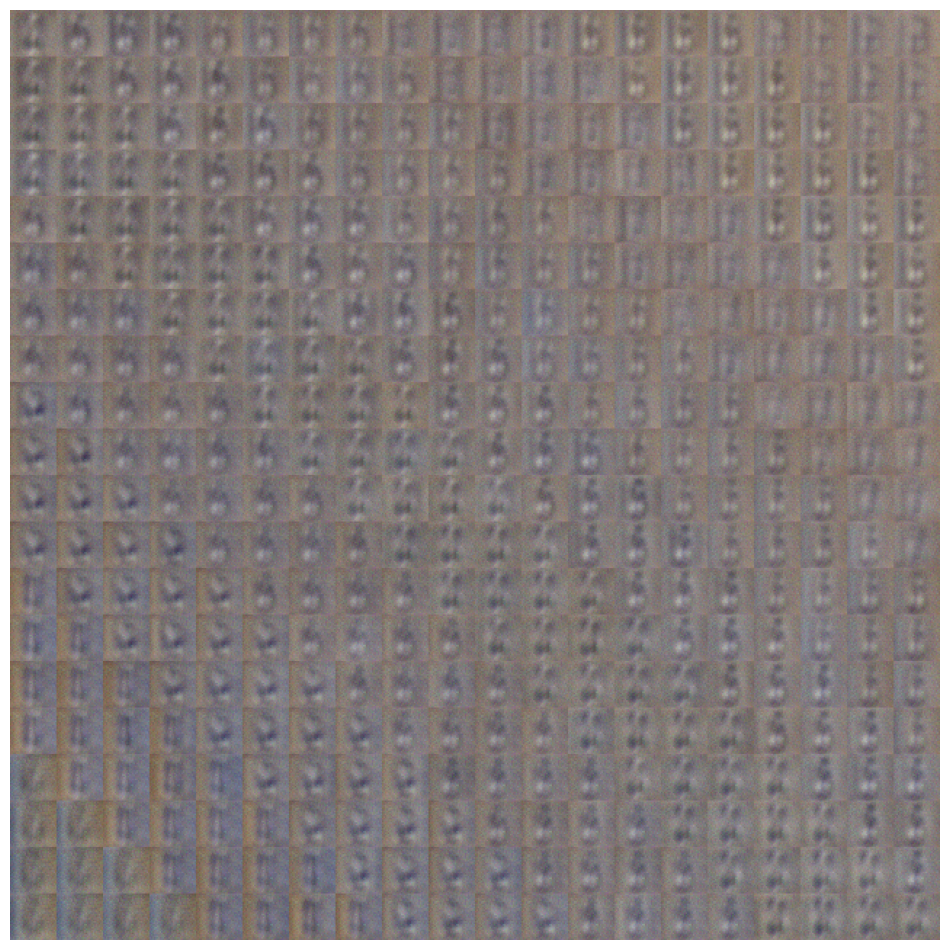

In [25]:
plot_reconstructed(cvae, xrange=(-2, 2), yrange=(-2, 2), N=20, conditional=True)

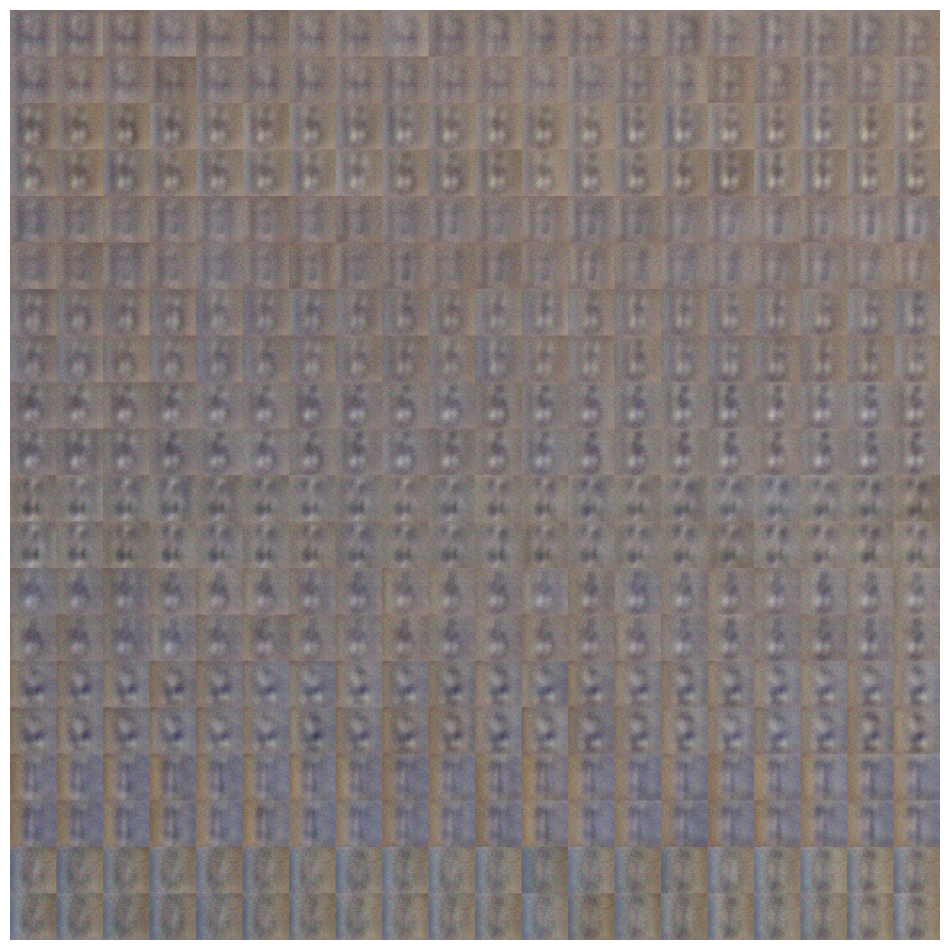

In [26]:
plot_reconstructed(cvae, xrange=(-2, 2), yrange=(-2, 2), N=20, conditional=True, cond_vis_mode="hori")

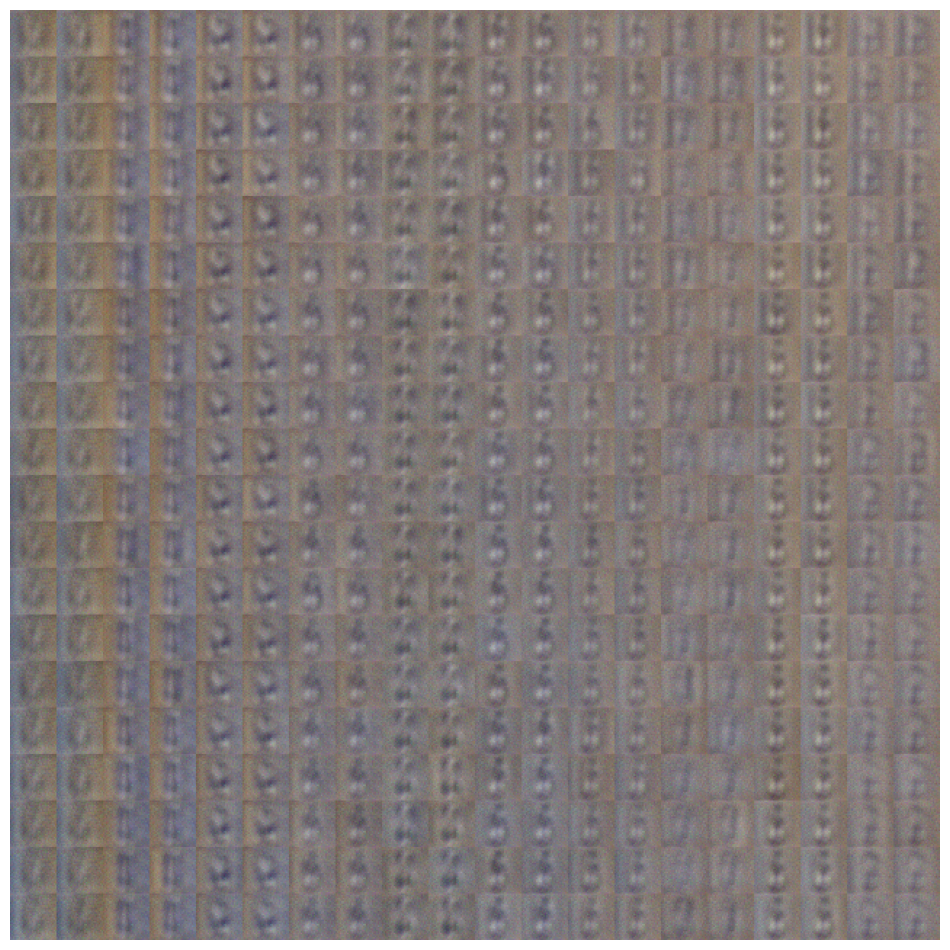

In [27]:
plot_reconstructed(cvae, xrange=(-2, 2), yrange=(-2, 2), N=20, conditional=True, cond_vis_mode="vert")

Investigation of latent space of Conditional Variational AE

In [ ]:
imgs_flat, latents, labels = [], [], []
with torch.no_grad():
    for imgs, lbls in valid_loader:
        imgs = imgs.to(device)
        # convert labels tensor to one hot vector
        lbls1hot = F.one_hot(lbls, 10).float()
        lbls1hot = lbls1hot.to(device)
        _, (z, _, _) = cvae(imgs, lbls1hot)
        imgs_flat.append(imgs.cpu().view(imgs.shape[0],-1))
        latents.append(z.cpu())
        labels.append(lbls.cpu())
        
imgs_flat = np.concatenate(imgs_flat)    
latents = np.concatenate(latents)
labels = np.concatenate(labels)

In [39]:
pca_imgs = PCA(n_components=2).fit_transform(imgs_flat)
pca_latents = PCA(n_components=2).fit_transform(latents)

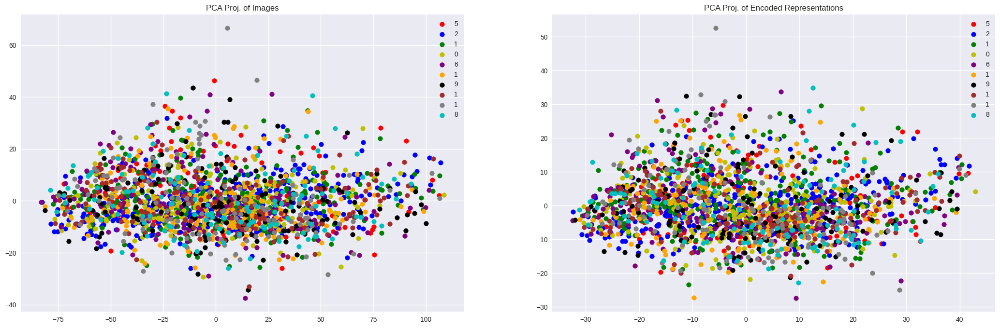

In [44]:
N = 2000
fig,ax = plt.subplots(1,2,figsize=(26,8))
display_projections(pca_imgs[:N], labels[:N], ax=ax[0], legend=valid_loader.dataset.labels)
ax[0].set_title("PCA Proj. of Images")
display_projections(pca_latents[:N], labels[:N], ax=ax[1], legend=valid_loader.dataset.labels)
ax[1].set_title("PCA Proj. of Encoded Representations")
plt.show()

Result seems even worst than in VAE case

We can observe different variations of average number-representations. Labels are changing in the diagonal/horizontal/vertical directions

Here is an example of interpolations in cvae with latent space size:

<center><img style="width: 40%" src="imgs/cvae_lat_2/cvae_lat_2.png"></center>

- d) Make a quantitative comparison between models using the Fréchet Inception Distance: https://arxiv.org/abs/1706.08500

For this task we should use the Inception V3 model, which is pretrained on Imagenet dataset. <br>
The use of activations from the Inception V3 model to summarize each image gives the score its name of “Frechet Inception Distance.”
<!-- Taken from https://wandb.ai/ayush-thakur/gan-evaluation/reports/How-to-Evaluate-GANs-using-Frechet-Inception-Distance-FID---Vmlldzo0MTAxOTI -->

In [ ]:
import torchvision.models
import glob
from torch.utils import data
from PIL import Image

# get inception v3 model 
inseption_model = models.inception_v3(weights=torchvision.models.Inception_V3_Weights.IMAGENET1K_V1)
inseption_model = inseption_model.to(device)

In [ ]:
def get_moments(model, samples):
    model.eval()

    with torch.no_grad():
        X_sum = torch.zeros((1000, 1)).to(device)
        XXT_sum = torch.zeros((1000, 1000)).to(device)
        count = 0

        for inp in tqdm(samples):
          # [B, F]
          pred = model(inp.to(device))
          # [B, F] -> [1, F] -> [F, 1]
          X_sum += pred.sum(dim=0, keepdim=True).T
          # [B, 1, F] x [B, F, 1] -> [B, F, F] -> [F, F]
          XXT_sum += (pred[:, None] * pred[..., None]).sum(0)
          count += len(inp)

        X_mean = X_sum / count
        X_cov = XXT_sum / count - X_mean @ X_mean.T

    return X_mean, X_cov

def frechet_inception_distance(m_w, C_w, m, C, debug=False):
    eigenvals = torch.linalg.eigvals(C @ C_w)
    trace_sqrt_CCw = eigenvals.real.clamp(min=0).sqrt().sum()
    if debug:
        print('Largest imaginary part magnitude:', eigenvals[eigenvals.imag > 0].abs().max().item())
        print('Most negative:', eigenvals[eigenvals.real < 0].real.min().item())
        print()
    fid = ((m - m_w)**2).sum() + C.trace() + C_w.trace() - 2 * trace_sqrt_CCw
    return fid

class FIDDataset(data.Dataset):
    def __init__(self, filelist=None, path=None):
        if filelist is not None:
          self.filelist = filelist
        else:
          self.filelist = glob.glob(f'{path}')
        self.transform = torchvision.models.Inception_V3_Weights.IMAGENET1K_V1.transforms()


    def __len__(self):
        return len(self.filelist)

    def __getitem__(self, idx):
        img = Image.open(self.filelist[idx])
        img = self.transform(img)
        return img

In [ ]:
cvae_recons_file_list = np.random.RandomState(42).permutation(glob.glob(f'./imgs/cvae/*png'))[:1000]
vae_recons_file_list = np.random.RandomState(42).permutation(glob.glob(f'./imgs/vae/*png'))

cvae_recons_dataset = FIDDataset(filelist=cvae_recons_file_list)
vae_recons_dataset = FIDDataset(filelist=vae_recons_file_list)

cvae_recons_loader = data.DataLoader(cvae_recons_dataset, batch_size=100, prefetch_factor=2, shuffle=False)
vae_recons_loader = data.DataLoader(vae_recons_dataset, batch_size=100, shuffle=False)

In [ ]:
m_cvae, C_cvae = get_moments(inseption_model, cvae_recons_loader)
m_vae, C_vae = get_moments(inseption_model, vae_recons_loader)

fid_cvae = frechet_inception_distance(m_vae, C_vae, m_cvae, C_cvae, debug=True)
fid_vae = frechet_inception_distance(m_cvae, C_cvae, m_vae, C_vae, debug=True)

print(f"FID for CVAE: {fid_cvae:{3}.{8}}")
print(f"FID for VAE: {fid_vae:{3}.{8}}")

100%|██████████| 1/1 [00:00<00:00, 19.56it/s]


Largest imaginary part magnitude: 0.0003027394413948059
Most negative: -0.00022941167117096484

Largest imaginary part magnitude: 0.00032907715649344027
Most negative: -0.000238061387790367

FID for CVAE: 171.54089
FID for VAE: 171.53049


Both networks perform very similar. According to the FID score Convolutional Variational Autoencoder performs a bit better than Conditional Variational Autoencoder (smaller values are better)

Performance of both networks depends very much on dimensions/size of latent space.<br>
In this assignment I have used both networks with latent dimentions = 12.<br>

Here is an example of Convolutional VEA reconstruction:
<center><img style="width: 40%" src="imgs/vae/recons35.png"></center>

Here is an example of the Conditional VEA with latent space dim = 2:
<center><img style="width: 40%" src="imgs/cvae_lat_2/recons29.png"></center>
It's difficult to store a lot of information only in 2D, that's why a lot of reconstructions seem not very clear.


- Extra point:
   - Train a beta-VAE using ResNet-based encoders and decoders.
   - Encoder is a ResNet-18
   - Decoder is the mirrored version of the encoder
   - Compare this model with the previous ones,